### Check PFT interactions on gridcells

### setup

In [51]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import dask
import os

In [52]:
### import some analysis functions we wrote for this project
import sys ; sys.path.append("../") #; sys.path.append("../../") 
from ppe_analysis.analysis import *
from pyfunctions import *

In [209]:
# Setup your PBSCluster
import dask
from dask_jobqueue import PBSCluster
from dask.distributed import Client
ncores=1
nmem='10GB'
cluster = PBSCluster(
    cores=ncores, # The number of cores you want
    memory=nmem, # Amount of memory
    processes=1, # How many processes
    queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
    local_directory='$TMPDIR', # Use your local directory
    resource_spec='select=1:ncpus='+str(ncores)+':mem='+nmem, # Specify resources
    project='P93300641', # Input your project ID here
    walltime='01:00:00' # Amount of wall time
    #interface='ib0', # Interface to use
)

# Scale up
cluster.scale(5)

# Setup your client
client = Client(cluster)

/glade/u/home/linnia/miniconda3/envs/mlenv/lib/python3.9/site-packages/dask_jobqueue/pbs.py:82: FutureWarning: project has been renamed to account as this kwarg was used wit -A option. You are still using it (please also check config files). If you did not set account yet, project will be respected for now, but it will be removed in a future release. If you already set account, project is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/glade/u/home/linnia/miniconda3/envs/mlenv/lib/python3.9/site-packages/distributed/node.py:183: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 46197 instead
  warnings.warn(


### Load Data

In [54]:
### Load data
dvs=['TLAI','TOTSOMN','TOTSOMN_1m','TWS','TSOI','SOIL3N','SMP','H2OSOI','VEGWP']
htape='h0'
yr0=2003
yr1=2004
ds_h0=get_exp('transient',dvs=dvs,tape=htape,yy=(yr0,yr1))

In [55]:
TLAI_amax_grid=amax(ds_h0.TLAI).mean(dim='year').compute()

In [56]:
H2OSOI_amean = amean(ds_h0.H2OSOI).mean(dim='year').compute()

In [57]:
TWS_amean = amean(ds_h0.TWS).mean(dim='year').compute()

In [58]:
TOTSOMN_amean = amean(ds_h0.TOTSOMN).mean(dim='year').compute()

In [174]:
TSOI_amax = amax(ds_h0.TSOI).mean(dim='year').compute()

In [184]:
TSOI_amean = amean(ds_h0.TSOI).mean(dim='year').compute()

In [59]:
### Load data
dvs=['TLAI','BTRANMN','GPP','NPP_NUPTAKE','NPP']
htape='h1'
yr0=2003
yr1=2004
ds_h1=get_exp('transient',dvs=dvs,tape=htape,yy=(yr0,yr1))

In [60]:
TLAI_amax=amax(ds_h1.TLAI).mean(dim='year').compute()

In [120]:
TLAI_amean=amean(ds_h1.TLAI).mean(dim='year').compute()

In [61]:
LHC_GPP_amean = amean(ds_h1.GPP).mean(dim='year').compute()

In [62]:
Nlim = ds_h1.NPP_NUPTAKE / (ds_h1.NPP_NUPTAKE + ds_h1.NPP)
NLIM_amean = amean(Nlim).mean(dim='year').compute()

In [70]:
ds_h1['BTRANMX'] = 1-ds_h1.BTRANMN

In [72]:
BTRAN_amean = amax(ds_h1.BTRANMX).mean(dim='year').compute()

In [73]:
BTRAN = 1-BTRAN_amean

In [63]:
# load parameter sets 
lhckey = '/glade/campaign/asp/djk2120/PPEn11/csvs/lhc220926.txt'
df = pd.read_csv(lhckey)
lhc_params = df.drop(columns='member')
num_params = len(lhc_params.columns)

In [64]:
pfts=xr.open_dataset('/glade/campaign/asp/djk2120/PPEn11/paramfiles/OAAT0000.nc').pftname
pft_names=[str(p)[2:-1].strip() for p in pfts.values]

### plot gridcell fractional coverage

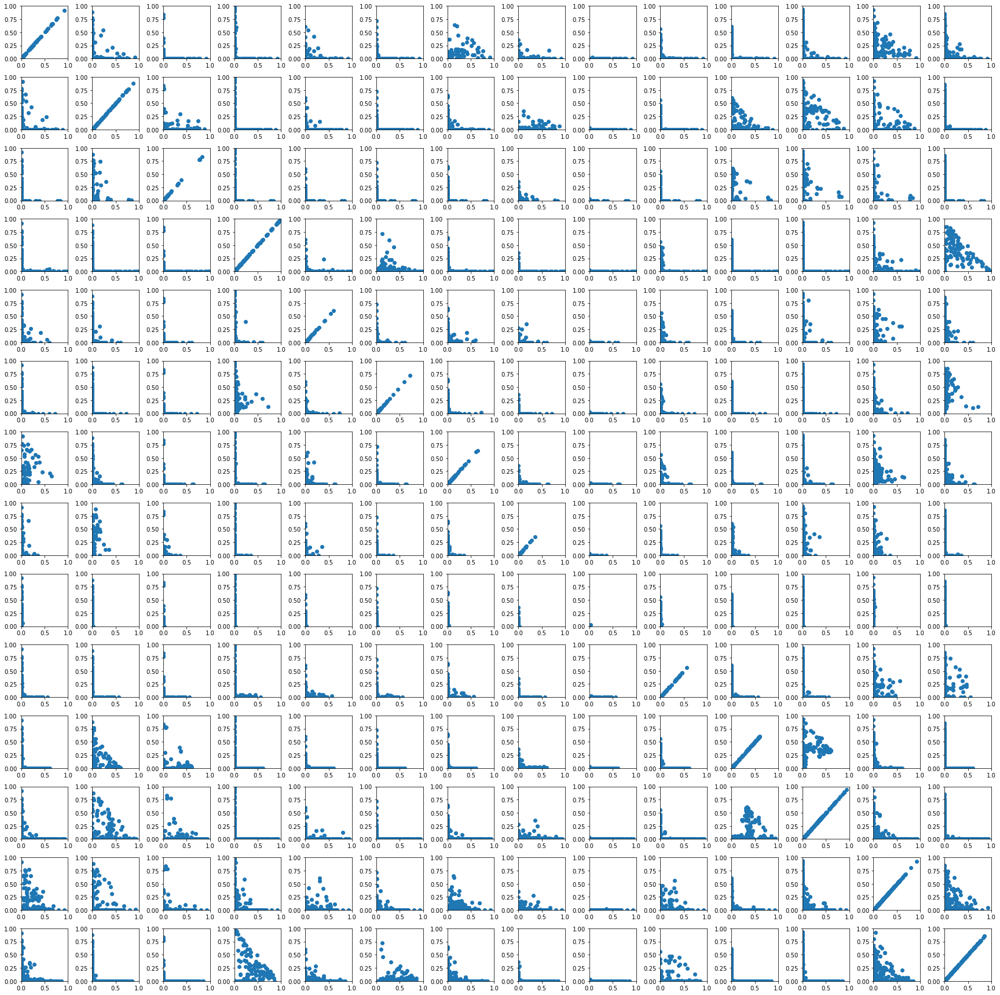

In [9]:
plt.figure(figsize=[24,24])
plt.rcParams.update({'font.size': 10})

ii=1
for xp in range(1,15):
    ixpft = ds_h1.pfts1d_itype_veg==xp
    xp_frac = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
    #xp_lai = TLAI_amax.isel(pft=ixpft).compute()
    for yp in range(1,15):
        ixpft = ds_h1.pfts1d_itype_veg==yp
        yp_frac = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
        #yp_lai = TLAI_amax.isel(pft=ixpft).compute()
        
        plt.subplot(14,14,ii)
        plt.scatter(xp_frac,yp_frac)
        plt.xlim([0,1])
        plt.ylim([0,1])
        #plt.xlabel(pft_names[xp],fontsize=6)
        #plt.ylabel(pft_names[yp],fontsize=6)
        ii = ii+1
plt.tight_layout()
#plt.savefig('PFT_fractional_coverage_gridcell_cornerplot.png')

### NL evergreen boreal shrubs (11) and C3 arctic grasses (12)

In [159]:
xp = 12
ixpft = ds_h1.pfts1d_itype_veg==xp
xp_frac = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
xp_lai = TLAI_amax.isel(pft=ixpft).compute()

yp=11
ixpft = ds_h1.pfts1d_itype_veg==yp
yp_frac = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
yp_lai = TLAI_amax.isel(pft=ixpft).compute()

In [160]:
xi = np.where((xp_frac>.35))
yi = np.where((yp_frac>.35))
mid_cells = np.intersect1d(xi, yi)

In [164]:
xi = np.where((xp_frac>0.5))
yi = np.where((yp_frac<0.1) & (yp_frac>0))
grass_cells = np.intersect1d(xi, yi)
grass_cells

array([  2, 310, 311, 358, 359, 362, 363, 366, 374, 376, 379])

In [163]:
xi = np.where((xp_frac<0.1) & (xp_frac>0))
yi = np.where((yp_frac>0.75))
shrub_cells = np.intersect1d(xi, yi)
shrub_cells

array([], dtype=int64)

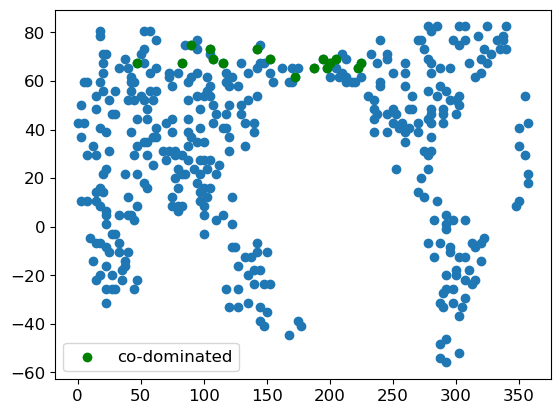

In [190]:
plt.scatter(ds_h1.grid1d_lon,ds_h1.grid1d_lat)
#plt.scatter(ds_h1.grid1d_lon.isel(gridcell=grass_cells),ds_h1.grid1d_lat.isel(gridcell=grass_cells),label='Grass dom cells')
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=mid_cells),ds_h1.grid1d_lat.isel(gridcell=mid_cells),c='green',label='co-dominated')
#plt.scatter(ds_h1.grid1d_lon.isel(gridcell=shrub_cells),ds_h1.grid1d_lat.isel(gridcell=shrub_cells),label='Shrub dom cells')
plt.legend(loc = 'lower left')
plt.savefig('tmp2.png',dpi=200)

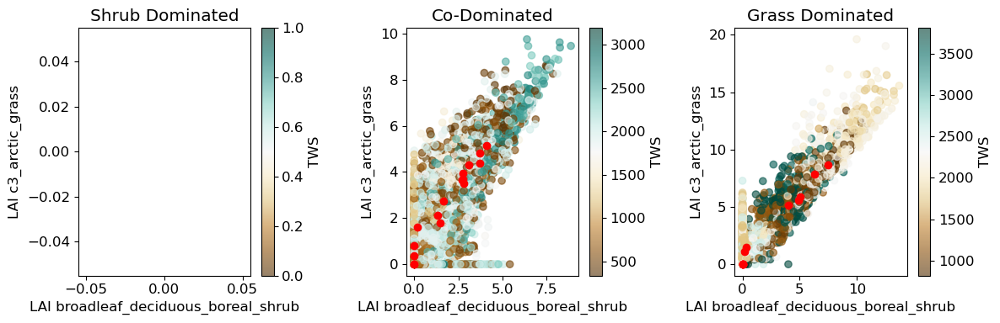

In [168]:
plt.figure(figsize=[12,4])
plt.rcParams.update({'font.size': 12})

plt.subplot(1,3,1)
plt.scatter(xp_lai[:,shrub_cells],yp_lai[:,shrub_cells],c=TWS_amean.isel(gridcell=shrub_cells),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(xp_lai[0,shrub_cells],yp_lai[0,shrub_cells],c='red')
plt.ylabel('LAI '+pft_names[12])
plt.xlabel('LAI '+pft_names[11])
plt.title('Shrub Dominated')

plt.subplot(1,3,2)
plt.scatter(xp_lai[:,mid_cells],yp_lai[:,mid_cells],c=TWS_amean.isel(gridcell=mid_cells),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(xp_lai[0,mid_cells],yp_lai[0,mid_cells],c='red')
plt.ylabel('LAI '+pft_names[12])
plt.xlabel('LAI '+pft_names[11])
plt.title('Co-Dominated')

plt.subplot(1,3,3)
plt.scatter(xp_lai[:,grass_cells],yp_lai[:,grass_cells],c=TWS_amean.isel(gridcell=grass_cells),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(xp_lai[0,grass_cells],yp_lai[0,grass_cells],c='red')
plt.ylabel('LAI '+pft_names[12])
plt.xlabel('LAI '+pft_names[11])
plt.title('Grass Dominated')

plt.tight_layout()

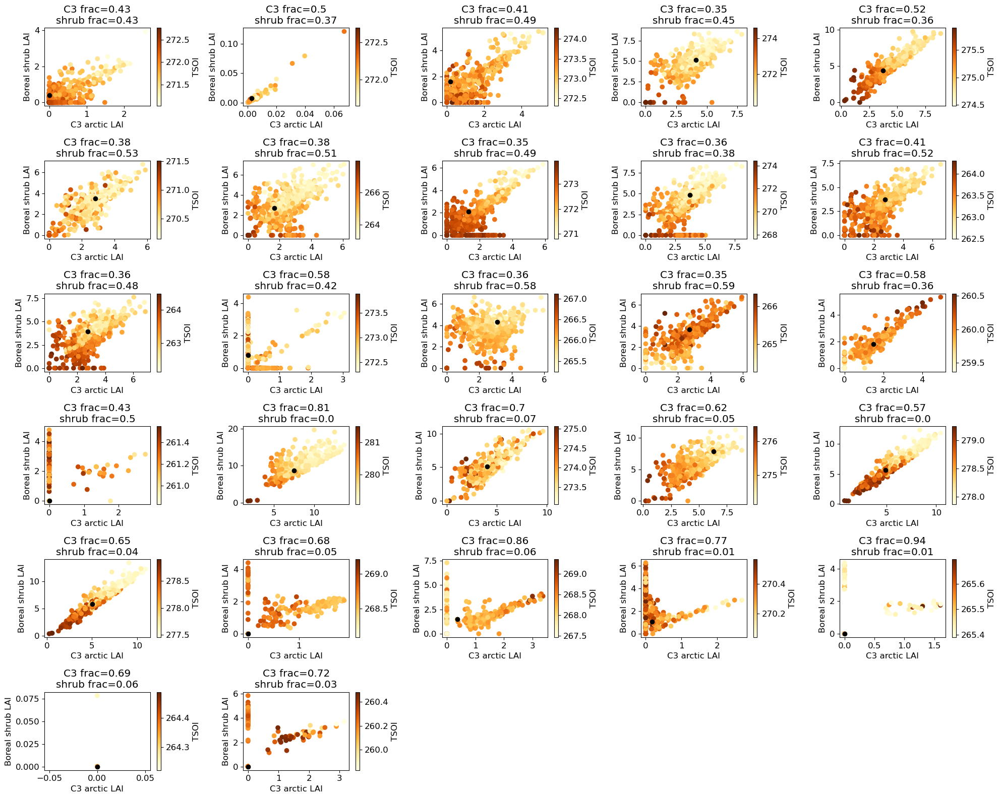

In [188]:
plt.figure(figsize=[20,16])
plt.rcParams.update({'font.size': 12})

ii = 1
for cell in range(len(mid_cells)):
    cix = mid_cells[cell]
    plt.subplot(6,5,ii)
    plt.scatter(xp_lai[:,cix],yp_lai[:,cix],c=TSOI_amean.isel(levgrnd=3,gridcell=cix),cmap='YlOrBr')
    plt.colorbar(label='TSOI')
    plt.scatter(xp_lai[0,cix],yp_lai[0,cix],c='k')
    plt.xlabel('C3 arctic LAI')
    plt.ylabel('Boreal shrub LAI')
    plt.title('C3 frac='+str(np.round(frac[cix,12],2)) +'\n'+'shrub frac='+str(np.round(frac[cix,11],2)))


    ii = ii+1
    

for cell in range(len(grass_cells)):
    cix = grass_cells[cell]
    plt.subplot(6,5,ii)
    plt.scatter(xp_lai[:,cix],yp_lai[:,cix],c=TSOI_amean.isel(levgrnd=3,gridcell=cix),cmap='YlOrBr')
    plt.colorbar(label='TSOI')
    plt.scatter(xp_lai[0,cix],yp_lai[0,cix],c='k')
    plt.xlabel('C3 arctic LAI')
    plt.ylabel('Boreal shrub LAI')
    plt.title('C3 frac='+str(np.round(frac[cix,12],2)) +'\n'+'shrub frac='+str(np.round(frac[cix,11],2)))


    ii = ii+1
        
plt.tight_layout()
plt.savefig('pft12_v_pft11_TSOImean.png',dpi=200)

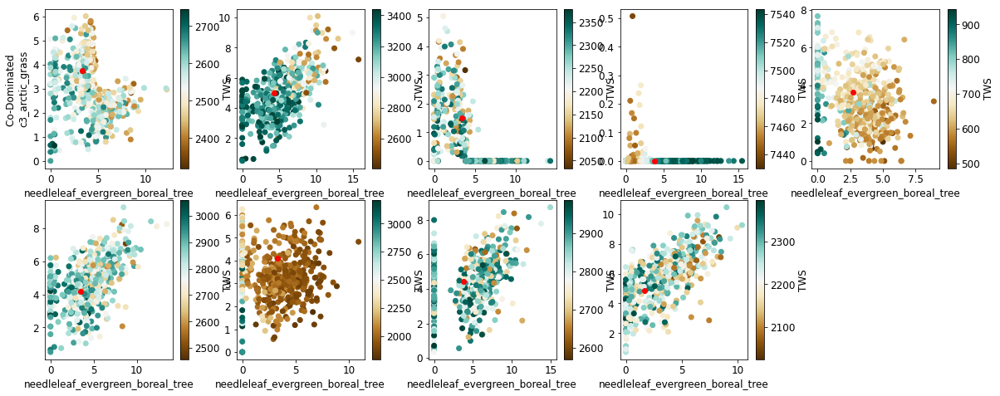

In [110]:
# All Co-dominated cells
plt.figure(figsize=[20,12])
plt.rcParams.update({'font.size': 12})

ii = 1
for cell in range(9):
    
    cix = mid_cells[cell]
    plt.subplot(3,5,ii+cell)
    plt.scatter(xp_lai[:,cix],yp_lai[:,cix],c=TWS_amean.isel(gridcell=cix),cmap='BrBG')
    plt.colorbar(label='TWS')
    plt.scatter(xp_lai[0,cix],yp_lai[0,cix],c='red')
    plt.xlabel(pft_names[2])
    if cell==0:
        plt.ylabel('Co-Dominated \n'+pft_names[12])


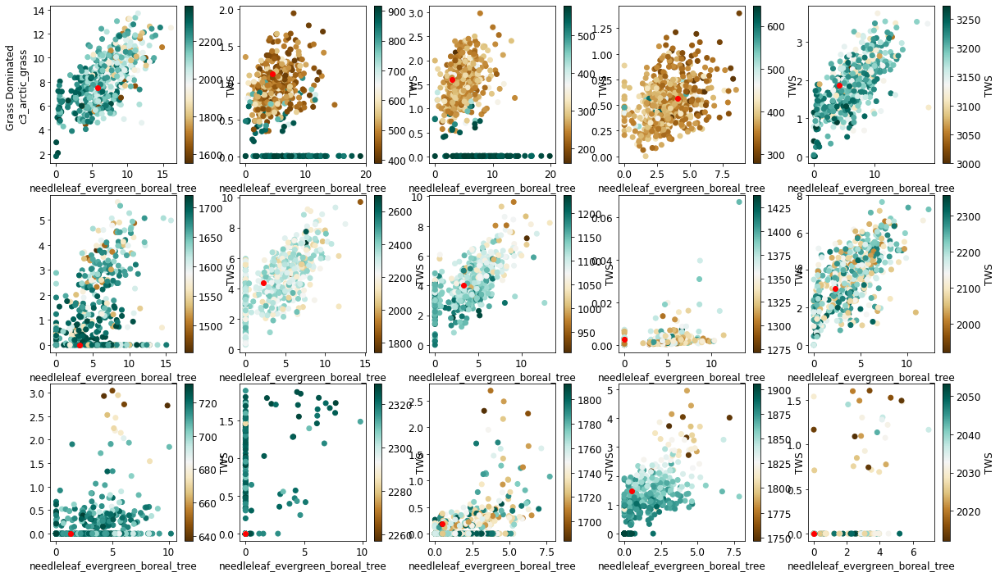

In [103]:
# All grass dominated cells
plt.figure(figsize=[20,12])
plt.rcParams.update({'font.size': 12})

ii = 1
for cell in range(15):
    
    cix = grass_cells[cell]
    plt.subplot(3,5,ii+cell)
    plt.scatter(xp_lai[:,cix],yp_lai[:,cix],c=TWS_amean.isel(gridcell=cix),cmap='BrBG')
    plt.colorbar(label='TWS')
    plt.scatter(xp_lai[0,cix],yp_lai[0,cix],c='red')
    plt.xlabel(pft_names[2])
    if cell==0:
        plt.ylabel('Grass Dominated \n'+pft_names[12])


In [16]:
p2_lai = xp_lai.isel(pft=np.argmin(xp_frac))
p12_lai = yp_lai.isel(pft=np.argmin(xp_frac))

In [125]:
frac = np.zeros((400,15))*np.NaN
for pft in range(1,15):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    frac[:,pft] = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values

In [140]:
c3arctic_cells = np.where(frac[:,12]>0.5)
c3arctic_cells

(array([  2, 178, 179, 235, 274, 291, 292, 310, 311, 328, 335, 349, 352,
        358, 359, 362, 363, 366, 369, 374, 376, 379]),)

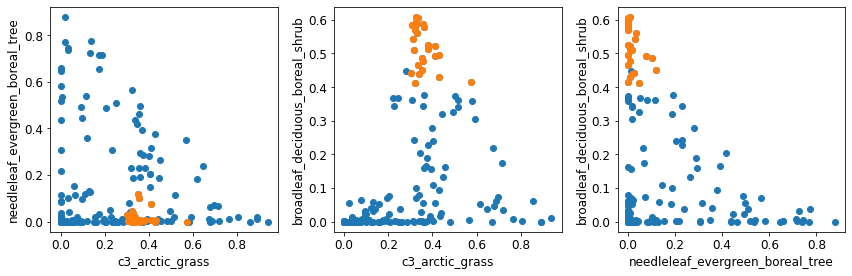

In [189]:
plt.figure(figsize=[12,4])
plt.rcParams.update({'font.size': 12})

cix = np.where((frac[:,12]>0.3) & (frac[:,11]>0.4))

plt.subplot(1,3,1)
plt.scatter(frac[:,12],frac[:,2])
plt.scatter(frac[cix,12],frac[cix,2])
plt.xlabel(pft_names[12])
plt.ylabel(pft_names[2])

plt.subplot(1,3,2)
plt.scatter(frac[:,12],frac[:,11])
plt.scatter(frac[cix,12],frac[cix,11])
plt.xlabel(pft_names[12])
plt.ylabel(pft_names[11])

plt.subplot(1,3,3)
plt.scatter(frac[:,2],frac[:,11])
plt.scatter(frac[cix,2],frac[cix,11])
plt.xlabel(pft_names[2])
plt.ylabel(pft_names[11])
plt.tight_layout()

plt.tight_layout()

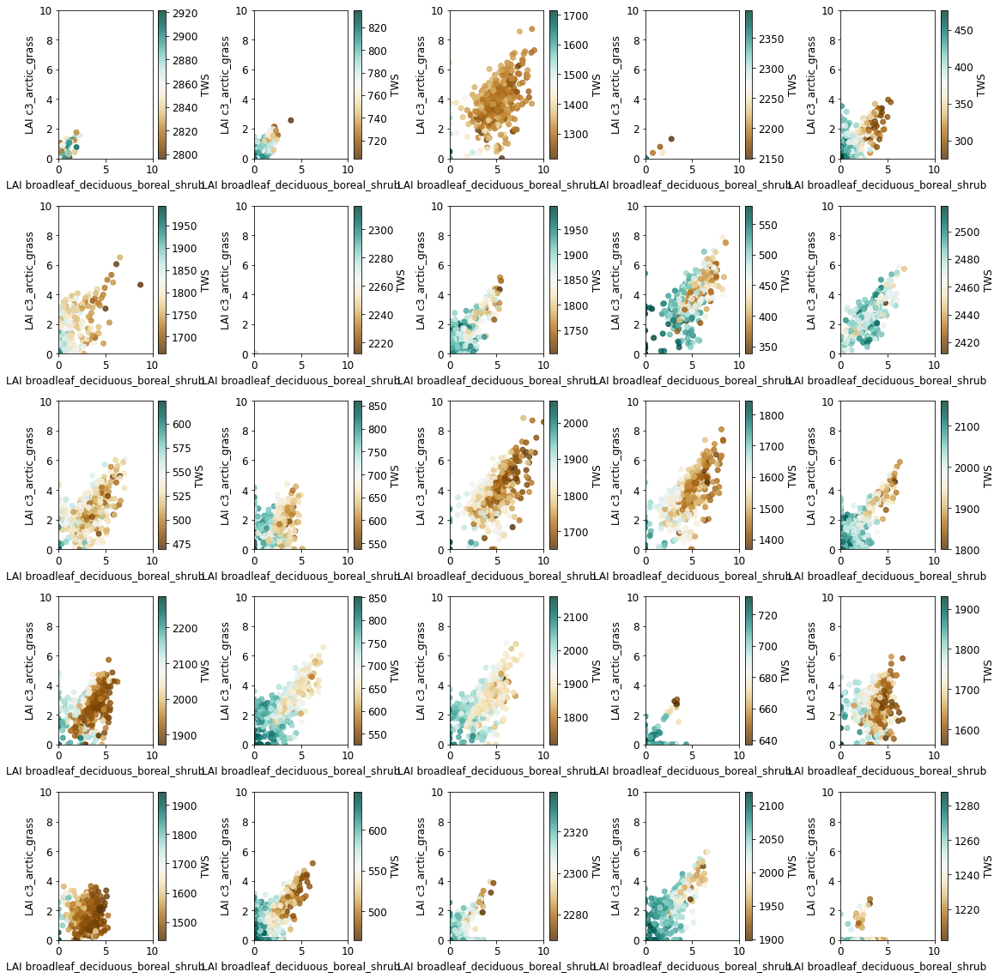

In [196]:
plt.figure(figsize=[16,16])
plt.rcParams.update({'font.size': 12})

AG_BS = np.where((frac[:,12]>0.3) & (frac[:,11]>0.4))[0]

xp = 11
ixpft = ds_h1.pfts1d_itype_veg==xp
xp_lai = TLAI_amax.isel(pft=ixpft).compute()

yp = 12
ixpft = ds_h1.pfts1d_itype_veg==yp
yp_lai = TLAI_amax.isel(pft=ixpft).compute()

zp = 2
ixpft = ds_h1.pfts1d_itype_veg==zp
zp_lai = TLAI_amax.isel(pft=ixpft).compute()

for i in range(len(AG_BS)):
    plt.subplot(5,5,i+1)
    cell = AG_BS[i]
    plt.scatter(xp_lai[:,cell],yp_lai[:,cell],c=TWS_amean.isel(gridcell=cell),cmap='BrBG',alpha=0.8)
    plt.colorbar(label='TWS')
    plt.xlim([0,10])
    plt.ylim([0,10])
    plt.xlabel('LAI '+pft_names[11])
    plt.ylabel('LAI '+pft_names[12])
    #plt.title('Co-dominant cells')

plt.tight_layout()
plt.savefig('high_C3arctic_grass_+pft11.png')

In [17]:
# which PFT dominates which gridcell
pft_mat = np.empty([400,14])*0.0
for i in range(1,14):
    pft_mat[:,i] = ds.pfts1d_wtgcell.sel(pft=i).values
dom_pft = np.argmax(pft_mat,axis=1)

<xarray.DataArray 'TLAI' (ens: 501, pft: 400)>
dask.array<getitem, shape=(501, 400), dtype=float32, chunksize=(1, 400), chunktype=numpy.ndarray>
Coordinates:
    time     object 2003-08-01 00:00:00
  * pft      (pft) float64 1.0 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0 1.0 1.0
Dimensions without coordinates: ens
Attributes:
    long_name:     total projected leaf area index
    units:         m^2/m^2
    cell_methods:  time: mean

### Combined fraction & LAI

In [199]:
frac = np.zeros((400,15))*np.NaN
cellpft_lai = np.zeros((501,400,15))*np.NaN
for pft in range(1,15):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    frac[:,pft] = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
    cellpft_lai[:,:,pft] = TLAI_amax.isel(pft=ixpft).compute()

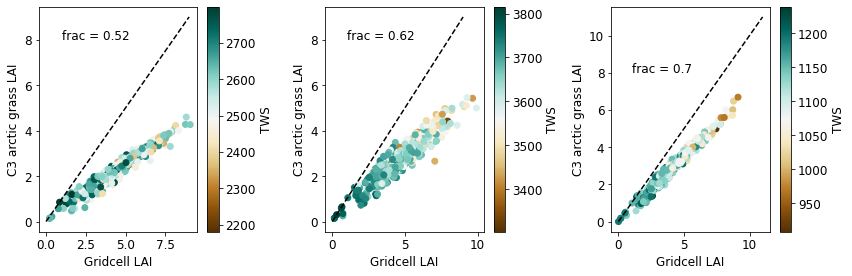

In [306]:
plt.figure(figsize=[12,4])
plt.rcParams.update({'font.size': 12})

cix = np.where((frac[:,12]>0.5))[0]
cTWS = TWS_amean.isel(gridcell=cix)
#for cell in range(len(cix)):
grass_LAI = cellpft_lai[:,cix,12]*frac[cix,12]
cLAI = TLAI_amax_grid.isel(gridcell=cix)

#Shrubs and arctic grasses covary together
plt.subplot(1,3,1)
cell =10
plt.scatter(cLAI[:,cell],grass_LAI[:,cell],c=cTWS.isel(gridcell=cell),cmap ='BrBG')
plt.colorbar(label='TWS')
plt.text(1,8,s='frac = '+str(np.round(frac[cix[cell],12],2)))
plt.plot([0,9],[0,9],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('C3 arctic grass LAI')

plt.subplot(1,3,2)
cell = 8
plt.scatter(cLAI[:,cell],grass_LAI[:,cell],c=cTWS.isel(gridcell=cell),cmap ='BrBG')
plt.colorbar(label='TWS')
plt.text(1,8,s='frac = '+str(np.round(frac[cix[cell],12],2)))
plt.plot([0,9],[0,9],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('C3 arctic grass LAI')

plt.subplot(1,3,3)
cell = 7
plt.scatter(cLAI[:,cell],grass_LAI[:,cell],c=cTWS.isel(gridcell=cell),cmap ='BrBG')
plt.colorbar(label='TWS')
plt.text(1,8,s='frac = '+str(np.round(frac[cix[cell],12],2)))
plt.plot([0,11],[0,11],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('C3 arctic grass LAI')

plt.tight_layout()

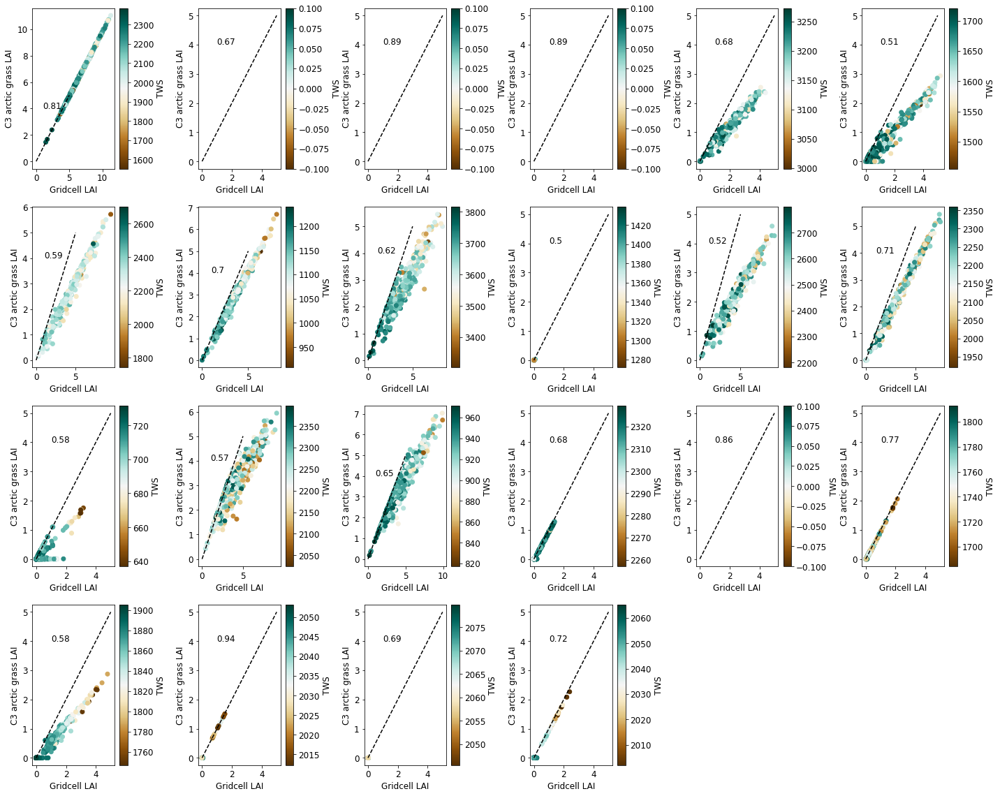

In [289]:
plt.figure(figsize=[20,16])
plt.rcParams.update({'font.size': 12})

ii = 0
for cell in range(22):
    plt.subplot(4,6,ii+1)
    plt.scatter(cLAI[:,cell],grass_LAI[:,cell],c=cTWS.isel(gridcell=cell),cmap ='BrBG')
    plt.colorbar(label='TWS')
    plt.text(1,4,s=str(np.round(frac[cix[cell],12],2)))
    plt.plot([0,5],[0,5],'--',c='k')
    plt.xlabel('Gridcell LAI')
    plt.ylabel('C3 arctic grass LAI')

    ii = ii+1

plt.tight_layout()

### NL evergreen temperate trees, C3 grasses, Broadleaf deciduous temperate trees

In [17]:
frac = np.zeros((400,17))*np.NaN
cellpft_lai = np.zeros((501,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    frac[:,pft] = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
    cellpft_lai[:,:,pft] = TLAI_amax.isel(pft=ixpft).compute()

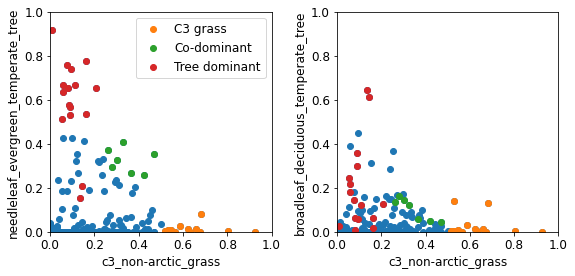

In [29]:
plt.figure(figsize=[12,4])
plt.rcParams.update({'font.size': 12})

c3_ix = np.where((frac[:,13]>0.5))
co_ix = np.where((frac[:,1]>0.25) & (frac[:,13]>0.25))
tree_ix = np.where((frac[:,1]>0.5) | (frac[:,7]>0.5))

plt.subplot(1,3,1)
plt.scatter(frac[:,13],frac[:,1])
plt.scatter(frac[c3_ix,13],frac[c3_ix,1],label='C3 grass')
plt.scatter(frac[co_ix,13],frac[co_ix,1],label='Co-dominant')
plt.scatter(frac[tree_ix,13],frac[tree_ix,1],label='Tree dominant')
plt.xlabel(pft_names[13])
plt.ylabel(pft_names[1])
plt.xlim([0,1])
plt.ylim([0,1])
plt.legend()

plt.subplot(1,3,2)
plt.scatter(frac[:,13],frac[:,7])
plt.scatter(frac[c3_ix,13],frac[c3_ix,7])
plt.scatter(frac[co_ix,13],frac[co_ix,7])
plt.scatter(frac[tree_ix,13],frac[tree_ix,7])
plt.xlabel(pft_names[13])
plt.ylabel(pft_names[7])
plt.xlim([0,1])
plt.ylim([0,1])

plt.tight_layout()

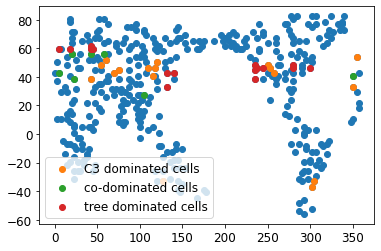

In [27]:
c3_ix = np.where((frac[:,13]>0.5))[0]
tree_ix = np.where((frac[:,1]>0.5) | (frac[:,7]>0.5))[0]
co_ix = np.where((frac[:,1]>0.25) & (frac[:,13]>0.25))[0]
plt.scatter(ds_h1.grid1d_lon,ds_h1.grid1d_lat)
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=c3_ix),ds_h1.grid1d_lat.isel(gridcell=c3_ix),label='C3 dominated cells')
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=co_ix),ds_h1.grid1d_lat.isel(gridcell=co_ix),label='co-dominated cells')
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=tree_ix),ds_h1.grid1d_lat.isel(gridcell=tree_ix),label='tree dominated cells')

plt.legend(loc = 'lower left')

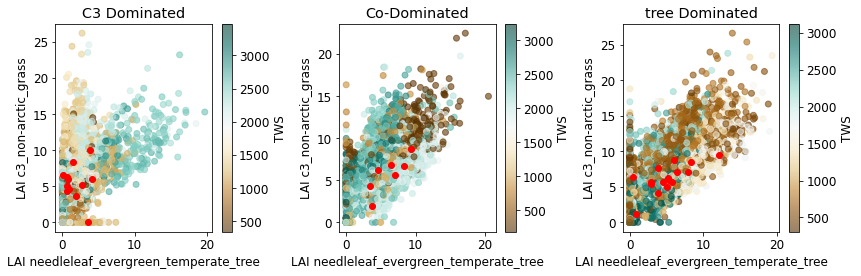

In [32]:
plt.figure(figsize=[12,4])
plt.rcParams.update({'font.size': 12})

plt.subplot(1,3,1)
plt.scatter(cellpft_lai[:,c3_ix,13],cellpft_lai[:,c3_ix,1],c=TWS_amean.isel(gridcell=c3_ix[0]),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(cellpft_lai[0,c3_ix,13],cellpft_lai[0,c3_ix,1],c='red')
plt.ylabel('LAI '+pft_names[13])
plt.xlabel('LAI '+pft_names[1])
plt.title('C3 Dominated')

plt.subplot(1,3,2)
plt.scatter(cellpft_lai[:,co_ix,13],cellpft_lai[:,co_ix,1],c=TWS_amean.isel(gridcell=co_ix[0]),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(cellpft_lai[0,co_ix,13],cellpft_lai[0,co_ix,1],c='red')
plt.ylabel('LAI '+pft_names[13])
plt.xlabel('LAI '+pft_names[1])
plt.title('Co-Dominated')

plt.subplot(1,3,3)
plt.scatter(cellpft_lai[:,tree_ix,13],cellpft_lai[:,tree_ix,1],c=TWS_amean.isel(gridcell=tree_ix[0]),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(cellpft_lai[0,tree_ix,13],cellpft_lai[0,tree_ix,1],c='red')
plt.ylabel('LAI '+pft_names[13])
plt.xlabel('LAI '+pft_names[1])
plt.title('tree Dominated')

plt.tight_layout()

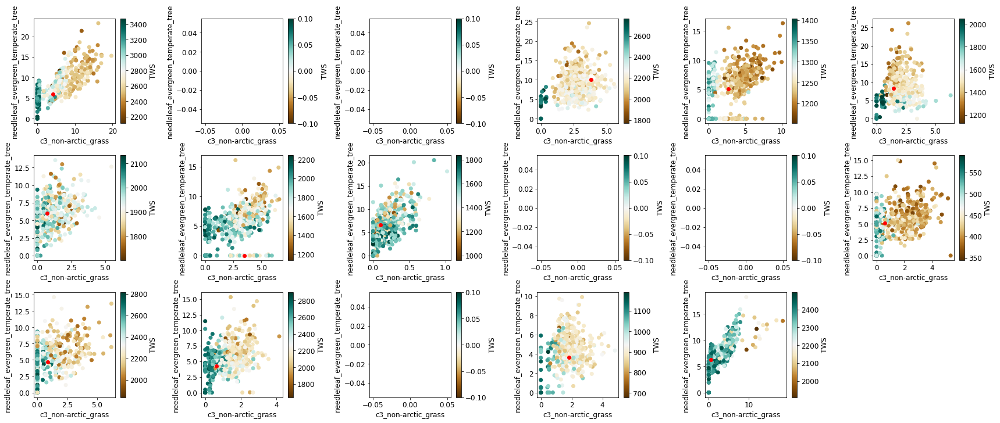

In [59]:
# All grass dominated cells
plt.figure(figsize=[24,10])
plt.rcParams.update({'font.size': 12})

c3_ix = np.where((frac[:,13]>0.5))[0]
ii = 1
for cell in range(17):
    
    cix = c3_ix[cell]
    plt.subplot(3,6,ii+cell)
    plt.scatter(cellpft_lai[:,c3_ix[cell],13],cellpft_lai[:,c3_ix[cell],1],c=TWS_amean.isel(gridcell=c3_ix[cell]),cmap='BrBG')
    plt.colorbar(label='TWS')
    plt.scatter(cellpft_lai[0,c3_ix[cell],13],cellpft_lai[0,c3_ix[cell],1],c='red')
    plt.xlabel(pft_names[13])
    plt.ylabel(pft_names[1])

plt.tight_layout()

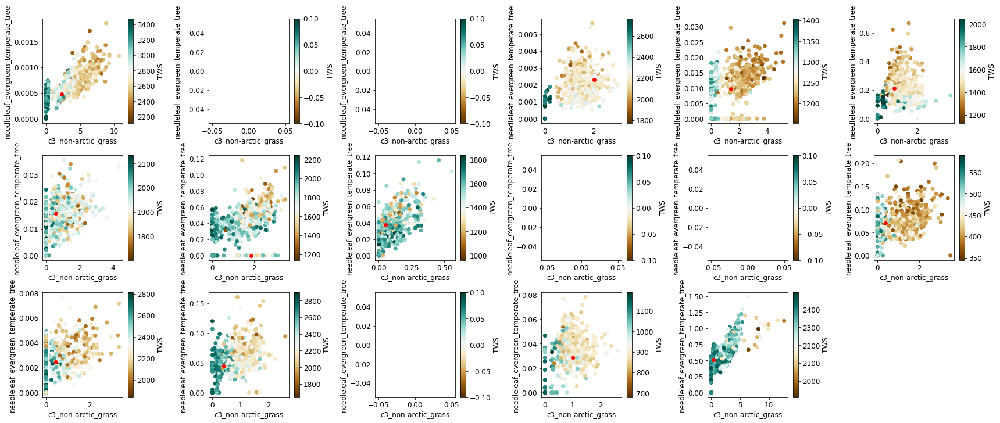

In [58]:
# All grass dominated cells
plt.figure(figsize=[24,10])
plt.rcParams.update({'font.size': 12})

c3_ix = np.where((frac[:,13]>0.5))[0]
ii = 1
for cell in range(17):
    
    cix = c3_ix[cell]
    plt.subplot(3,6,ii+cell)
    plt.scatter(cellpft_lai[:,c3_ix[cell],13]*frac[c3_ix[cell],13],cellpft_lai[:,c3_ix[cell],1]*frac[c3_ix[cell],1],c=TWS_amean.isel(gridcell=c3_ix[cell]),cmap='BrBG')
    plt.colorbar(label='TWS')
    plt.scatter(cellpft_lai[0,c3_ix[cell],13]*frac[c3_ix[cell],13],cellpft_lai[0,c3_ix[cell],1]*frac[c3_ix[cell],1],c='red')
    plt.xlabel(pft_names[13])
    plt.ylabel(pft_names[1])
    #plt.xlim([0,12])
    #plt.ylim([0,0.5])

plt.tight_layout()

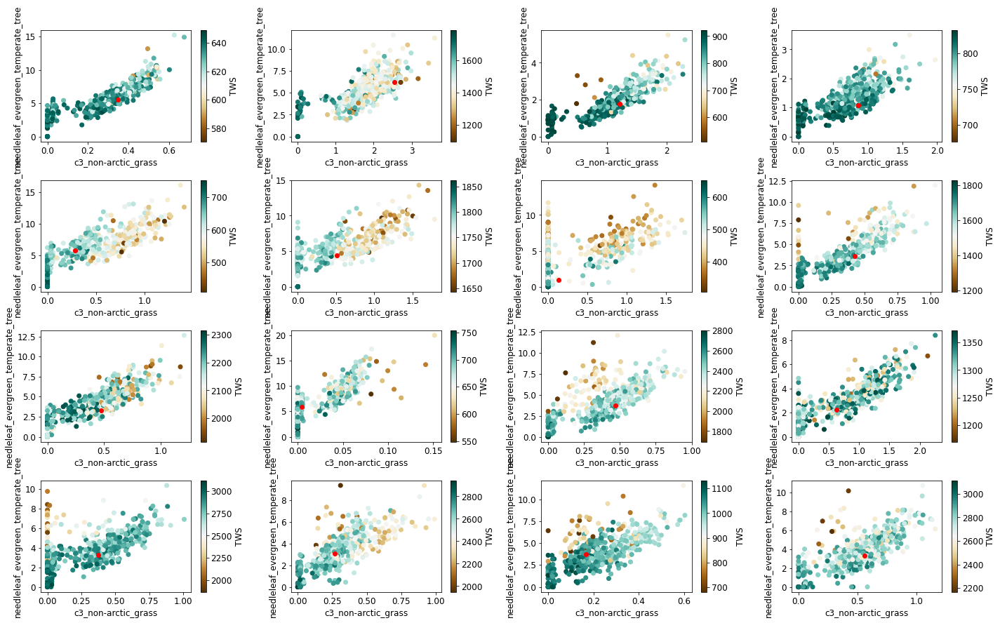

In [50]:
# All tree dominated cells
plt.figure(figsize=[20,12])
plt.rcParams.update({'font.size': 12})

ix = np.where((frac[:,1]>0.5) | (frac[:,7]>0.5))[0]
ii = 1
for cell in range(16):
    
    cix = tree_ix[cell]
    plt.subplot(4,4,ii+cell)
    plt.scatter(cellpft_lai[:,ix[cell],13]*frac[ix[cell],13],cellpft_lai[:,ix[cell],1]*frac[ix[cell],1],c=TWS_amean.isel(gridcell=ix[cell]),cmap='BrBG')
    plt.colorbar(label='TWS')
    plt.scatter(cellpft_lai[0,ix[cell],13]*frac[ix[cell],13],cellpft_lai[0,ix[cell],1]*frac[ix[cell],1],c='red')
    plt.xlabel(pft_names[13])
    plt.ylabel(pft_names[1])
    #plt.xlim([0,12])
    #plt.ylim([0,0.5])

plt.tight_layout()

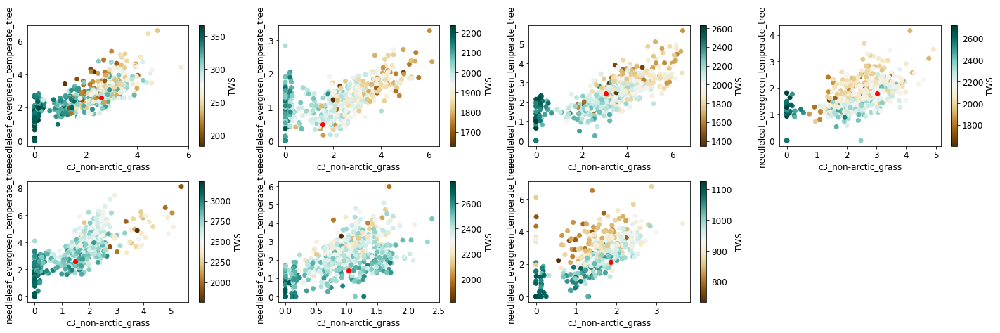

In [52]:
# All co-dominated cells
plt.figure(figsize=[20,12])
plt.rcParams.update({'font.size': 12})

ix = np.where((frac[:,1]>0.25) & (frac[:,13]>0.25))[0]
ii = 1
for cell in range(7):
    
    cix = tree_ix[cell]
    plt.subplot(4,4,ii+cell)
    plt.scatter(cellpft_lai[:,ix[cell],13]*frac[ix[cell],13],cellpft_lai[:,ix[cell],1]*frac[ix[cell],1],c=TWS_amean.isel(gridcell=ix[cell]),cmap='BrBG')
    plt.colorbar(label='TWS')
    plt.scatter(cellpft_lai[0,ix[cell],13]*frac[ix[cell],13],cellpft_lai[0,ix[cell],1]*frac[ix[cell],1],c='red')
    plt.xlabel(pft_names[13])
    plt.ylabel(pft_names[1])
    #plt.xlim([0,12])
    #plt.ylim([0,0.5])

plt.tight_layout()

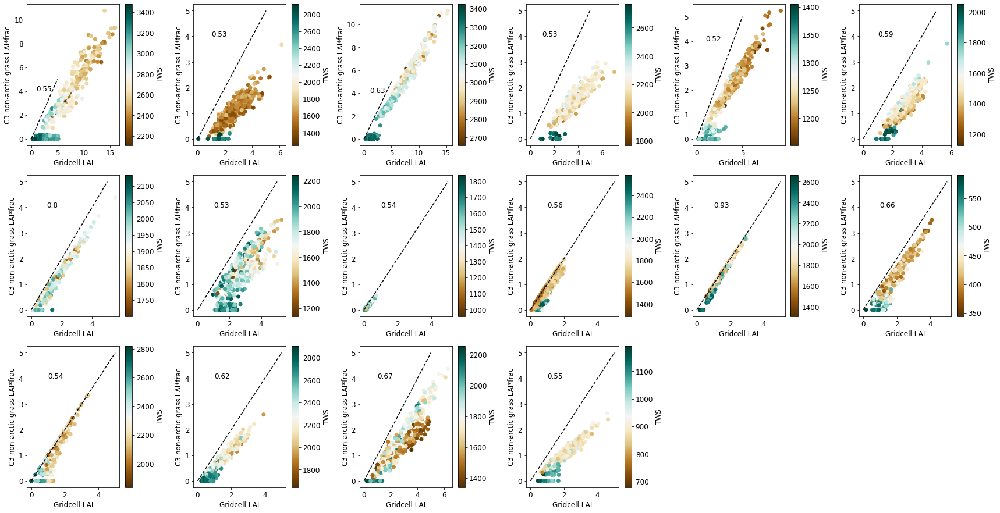

In [168]:
plt.figure(figsize=[24,16])
plt.rcParams.update({'font.size': 12})

cix = np.where((frac[:,13]>0.5))[0]
#cix = np.where((frac[:,1]>0.25) & (frac[:,13]>0.25))[0]
cTWS = TWS_amean.isel(gridcell=cix)
grass_LAI = cellpft_lai[:,cix,13]*frac[cix,13]
cLAI = TLAI_amax_grid.isel(gridcell=cix)

ii = 0
for cell in range(16):
    plt.subplot(4,6,ii+1)
    plt.scatter(cLAI[:,cell],grass_LAI[:,cell],c=cTWS.isel(gridcell=cell),cmap ='BrBG')
    plt.colorbar(label='TWS')
    plt.text(1,4,s=str(np.round(frac[cix[cell],13],2)))
    plt.plot([0,5],[0,5],'--',c='k')
    plt.xlabel('Gridcell LAI')
    plt.ylabel('C3 non-arctic grass LAI*frac')

    ii = ii+1

plt.tight_layout()

### Single cell of interest

In [ ]:
sm3 = amean(ds_h0.H2OSOI.isel(levsoi=3)).mean(dim='year').compute()
TOTSOMN = amean(ds_h0.TOTSOMN).mean(dim='year').compute()
TOTSOMN_1m = amean(ds_h0.TOTSOMN_1m).mean(dim='year').compute()

In [92]:
#cix = np.where((frac[:,1]>0.5) | (frac[:,7]>0.5))[0] # tree dominant
cix = np.where((frac[:,1]>0.25) & (frac[:,13]>0.25))[0] # co-dominant
#cix = np.where((frac[:,13]>0.5))[0] # grass dominant
cell = 2

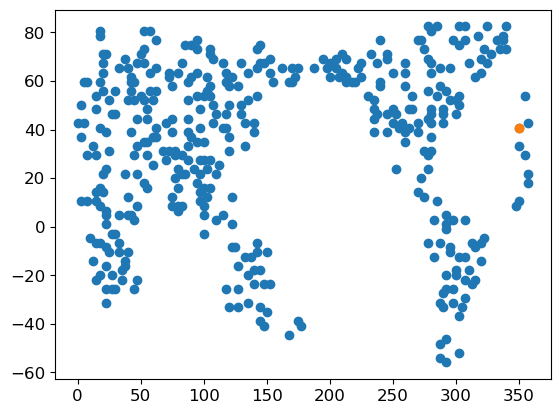

In [93]:
ix = cix[cell]
plt.scatter(ds_h1.grid1d_lon,ds_h1.grid1d_lat)
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=ix),ds_h1.grid1d_lat.isel(gridcell=ix),label='C3 dominated cells')

Text(0.5, 1.0, 'Gridcell=203')

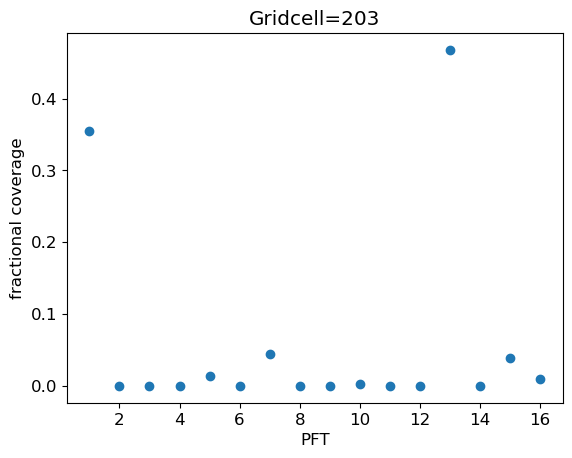

In [94]:
plt.scatter(range(1,17),frac[ix,1:17])
plt.xlabel('PFT')
plt.ylabel('fractional coverage')
plt.title('Gridcell='+str(ix))

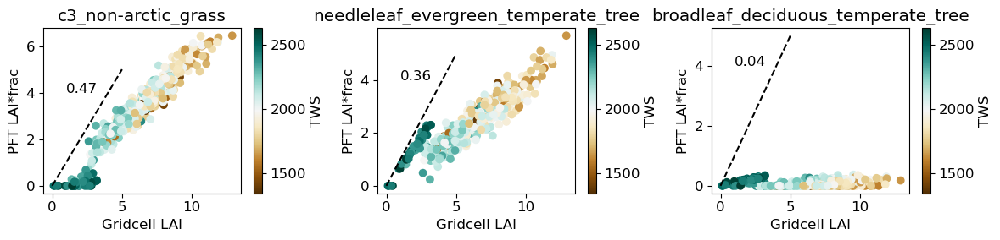

In [95]:
# Water
plt.figure(figsize=[12,3])
plt.rcParams.update({'font.size': 12})

cTWS = TWS_amean.isel(gridcell=ix)
#cTWS = sm3.isel(gridcell=cix)
cLAI = TLAI_amax_grid.isel(gridcell=ix)

LAI = cellpft_lai[:,ix,13]*frac[ix,13]
plt.subplot(1,3,1)
plt.scatter(cLAI,LAI,c=cTWS,cmap ='BrBG')
plt.colorbar(label='TWS')
plt.text(1,4,s=str(np.round(frac[ix,13],2)))
plt.plot([0,5],[0,5],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('PFT LAI*frac')
plt.title(pft_names[13])

LAI = cellpft_lai[:,ix,1]*frac[ix,1]
plt.subplot(1,3,2)
plt.scatter(cLAI,LAI,c=cTWS,cmap ='BrBG')
plt.colorbar(label='TWS')
plt.text(1,4,s=str(np.round(frac[ix,1],2)))
plt.plot([0,5],[0,5],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('PFT LAI*frac')
plt.title(pft_names[1])

LAI = cellpft_lai[:,ix,7]*frac[ix,7]
plt.subplot(1,3,3)
plt.scatter(cLAI,LAI,c=cTWS,cmap ='BrBG')
plt.colorbar(label='TWS')
plt.text(1,4,s=str(np.round(frac[ix,7],2)))
plt.plot([0,5],[0,5],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('PFT LAI*frac')
plt.title(pft_names[7])

plt.tight_layout()

In [96]:
# Nutrients
plt.figure(figsize=[12,3])
plt.rcParams.update({'font.size': 12})

cTWS = TOTSOMN.isel(gridcell=ix)
cLAI = TLAI_amax_grid.isel(gridcell=ix)

LAI = cellpft_lai[:,ix,13]*frac[ix,13]
plt.subplot(1,3,1)
plt.scatter(cLAI,LAI,c=cTWS,cmap ='Greens')
plt.colorbar(label='TOTSOMN')
plt.text(1,4,s=str(np.round(frac[ix,13],2)))
plt.plot([0,5],[0,5],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('PFT LAI*frac')
plt.title(pft_names[13])

LAI = cellpft_lai[:,ix,1]*frac[ix,1]
plt.subplot(1,3,2)
plt.scatter(cLAI,LAI,c=cTWS,cmap ='Greens')
plt.colorbar(label='TOTSOMN')
plt.text(1,4,s=str(np.round(frac[ix,1],2)))
plt.plot([0,5],[0,5],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('PFT LAI*frac')
plt.title(pft_names[1])

LAI = cellpft_lai[:,ix,7]*frac[ix,7]
plt.subplot(1,3,3)
plt.scatter(cLAI,LAI,c=cTWS,cmap ='Greens')
plt.colorbar(label='TOTSOMN')
plt.text(1,4,s=str(np.round(frac[ix,7],2)))
plt.plot([0,5],[0,5],'--',c='k')
plt.xlabel('Gridcell LAI')
plt.ylabel('PFT LAI*frac')
plt.title(pft_names[7])

plt.tight_layout()

NameError: name 'TOTSOMN' is not defined

<Figure size 1200x300 with 0 Axes>

### All C3 grass gridcell

In [21]:
GPP_amean=amean(ds_h1.GPP).mean(dim='year').compute()

In [22]:
cellpft_gpp = np.zeros((501,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    cellpft_gpp[:,:,pft] = GPP_amean.isel(pft=ixpft).compute()

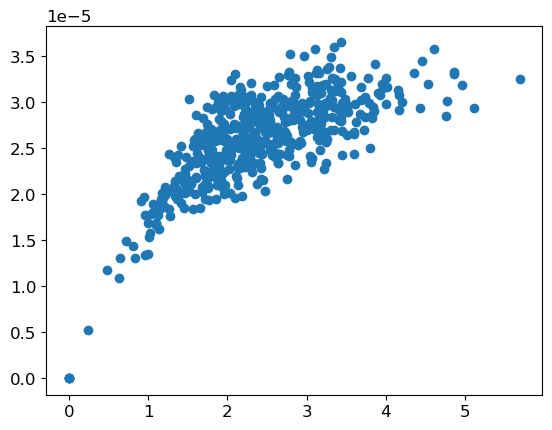

In [97]:
LAI_max = cellpft_lai[:,ix,1]*frac[ix,1]
GPP_mean = cellpft_gpp[:,ix,1]*frac[ix,1]
plt.scatter(LAI_max,GPP_mean)

### OAAT emulator

In [88]:
# train an emulator to this gridcell 
from esem import gp_model

# load parameter sets 
lhckey = '/glade/campaign/asp/djk2120/PPEn11/csvs/lhc220926.txt'
df = pd.read_csv(lhckey)
lhc_params = df.drop(columns='member')
num_params = len(lhc_params.columns)

In [89]:
frac = np.zeros((400,17))*np.NaN
cellpft_lai = np.zeros((501,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    frac[:,pft] = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
    cellpft_lai[:,:,pft] = TLAI_amax.isel(pft=ixpft).compute()

In [41]:
TLAI_amean=amean(ds_h1.TLAI).mean(dim='year').compute()

In [42]:
cellpft_lai_mean = np.zeros((501,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    cellpft_lai_mean[:,:,pft] = TLAI_amean.isel(pft=ixpft).compute()

In [185]:
#cix = np.where((frac[:,14]<0.5) & (frac[:,14]>0.2))[0] 
#cix = np.where((frac[:,4]>0.3) & (frac[:,14]>0.3))[0] # co-dominant
cix = np.where((frac[:,13]>0.5))[0] 
cell = 2
ix = cix[cell]

In [203]:
c4_lai = pd.DataFrame({'C4LAI':np.nanmean(cellpft_lai[1:,cix,13]*frac[cix,13],axis=1)})
bl_lai = pd.DataFrame({'BLLAI':np.nanmean(cellpft_lai[1:,cix,1]*frac[cix,1],axis=1)})

In [204]:
aug_params = pd.concat((lhc_params,bl_lai),axis=1)

In [205]:
X_train = aug_params.iloc[50:,:]
X_test = aug_params.iloc[:50,:]

y_train = np.nanmean(cellpft_lai[51:,cix,13],axis=1)
y_test = np.nanmean(cellpft_lai[1:51,cix,13],axis=1)

#y_train = cellpft_gpp[51:,ix,13]
#y_test = cellpft_gpp[1:51,ix,13]

In [206]:
C3emulator = gp_model(np.array(X_train),np.array(y_train))

In [212]:
y_pred, y_pred_var = C3emulator.predict(X_test)

Text(0.5, 1.0, 'C3 grass \n (C3>50% coverage)')

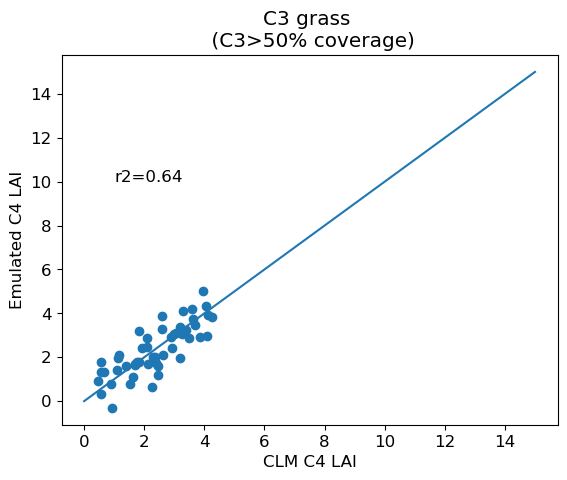

In [213]:
r = np.corrcoef(y_test,y_pred)
r2 = r**2
R2 = np.round(r2[0,1],2)
plt.scatter(y_test,y_pred)
plt.plot([0,15],[0,15])
plt.text(1,10,'r2='+str(R2))
plt.xlabel('CLM C4 LAI')
plt.ylabel('Emulated C4 LAI')
plt.title('C3 grass \n (C3>50% coverage)')

In [161]:
# One-at-a-time sensitivity 
n=21
num_params = 32
s = np.linspace(0,1,n)
unif = pd.concat([pd.DataFrame(np.tile(0.5,n))]*num_params,axis=1) # hold all parameters at median value
unif.columns = lhc_params.columns
#unif['leafcn'] = np.tile(0.8,n) # change individual parameter default setting for OAAT

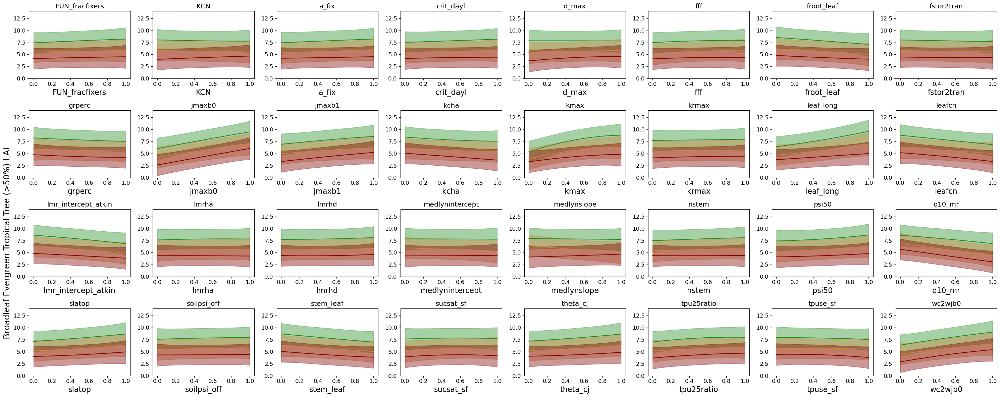

In [162]:
plt.figure(figsize=[30,12])
plt.rcParams.update({'font.size': 12})
sample = unif
for i, p in enumerate(lhc_params.columns):
    
    ax=plt.subplot(4,8,i+1)
    sample[p] = s
    oaat, var = BLemulator.predict(sample)
    sd = var**0.5
    sample[p] = np.tile(0.5,n) # set column back to median
    ax.fill_between(s, oaat-sd, oaat+sd,color='forestgreen',alpha=0.4) # shade three standard deviations
    ax.plot(s,oaat,c='forestgreen',label='BL')
    
    sample[p] = s
    oaat, var = CoBLemulator.predict(sample)
    sd = var**0.5
    sample[p] = np.tile(0.5,n) # set column back to median
    ax.fill_between(s, oaat-sd, oaat+sd,color='peru',alpha=0.4) # shade three standard deviations
    ax.plot(s,oaat,c='peru',label='C4')
    
    sample[p] = s
    oaat, var = C4emulator.predict(sample)
    sd = var**0.5
    sample[p] = np.tile(0.5,n) # set column back to median
    ax.fill_between(s, oaat-sd, oaat+sd,color='maroon',alpha=0.4) # shade three standard deviations
    ax.plot(s,oaat,c='maroon',label='C4')
    
    
    plt.title(p)
    #plt.text(0,0.2,p)
    #plt.plot([0,1],[default, default],'--',c='k')
    ax.set_xlabel(p,fontsize=16)
    ax.set_ylim([0,14])
    if i == 16:
        plt.ylabel('Broadleaf Evergreen Tropical Tree (>50%) LAI',fontsize=18)

plt.tight_layout()
#plt.savefig('../figs/param_sens/OAAT_sensitivity_PFT1-4-13_gmLAI.png',dpi=200)

### C4 grasses & Broadleaf evergreen tropical trees & C3 grasses

In [32]:
frac = np.zeros((400,17))*np.NaN
cellpft_lai = np.zeros((501,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    frac[:,pft] = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
    cellpft_lai[:,:,pft] = TLAI_amax.isel(pft=ixpft).compute()

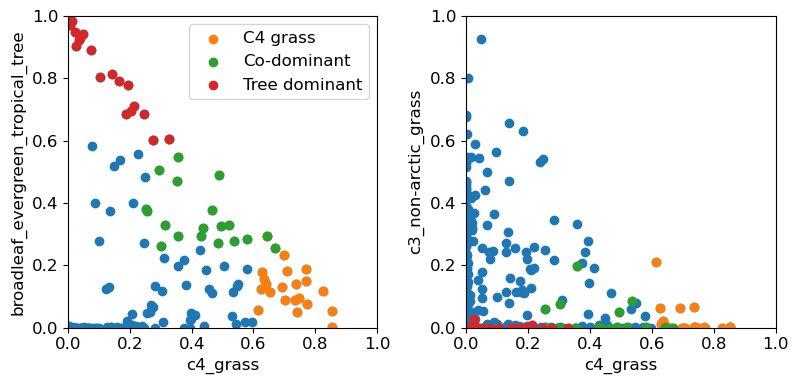

In [33]:
plt.figure(figsize=[12,4])
plt.rcParams.update({'font.size': 12})

c4_ix = np.where((frac[:,14]>0.6))
co_ix = np.where((frac[:,4]>0.25) & (frac[:,14]>0.25))
tree_ix = np.where((frac[:,4]>0.6))

plt.subplot(1,3,1)
plt.scatter(frac[:,14],frac[:,4])
plt.scatter(frac[c4_ix,14],frac[c4_ix,4],label='C4 grass')
plt.scatter(frac[co_ix,14],frac[co_ix,4],label='Co-dominant')
plt.scatter(frac[tree_ix,14],frac[tree_ix,4],label='Tree dominant')
plt.xlabel(pft_names[14])
plt.ylabel(pft_names[4])
plt.xlim([0,1])
plt.ylim([0,1])
plt.legend()

plt.subplot(1,3,2)
plt.scatter(frac[:,14],frac[:,13])
plt.scatter(frac[c4_ix,14],frac[c4_ix,13])
plt.scatter(frac[co_ix,14],frac[co_ix,13])
plt.scatter(frac[tree_ix,14],frac[tree_ix,13])
plt.xlabel(pft_names[14])
plt.ylabel(pft_names[13])
plt.xlim([0,1])
plt.ylim([0,1])

plt.tight_layout()

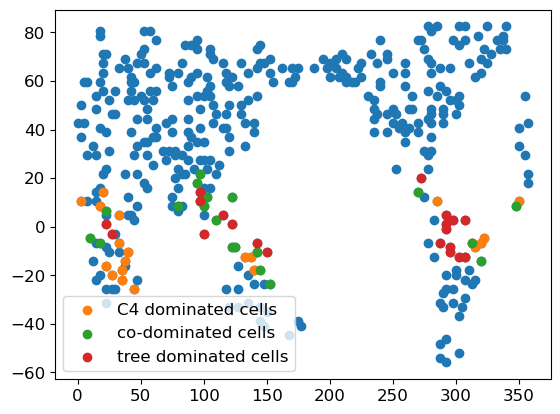

In [34]:
plt.scatter(ds_h1.grid1d_lon,ds_h1.grid1d_lat)
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=c4_ix[0]),ds_h1.grid1d_lat.isel(gridcell=c4_ix[0]),label='C4 dominated cells')
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=co_ix[0]),ds_h1.grid1d_lat.isel(gridcell=co_ix[0]),label='co-dominated cells')
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=tree_ix[0]),ds_h1.grid1d_lat.isel(gridcell=tree_ix[0]),label='tree dominated cells')

plt.legend(loc = 'lower left')

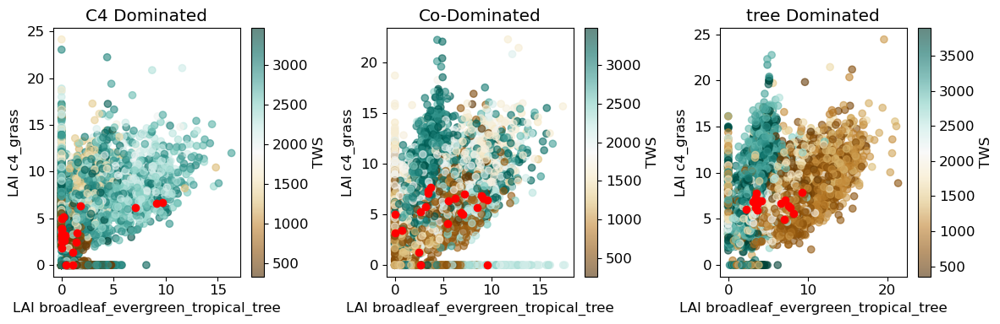

In [17]:
plt.figure(figsize=[12,4])
plt.rcParams.update({'font.size': 12})

plt.subplot(1,3,1)
plt.scatter(cellpft_lai[:,c4_ix,14],cellpft_lai[:,c4_ix,4],c=TWS_amean.isel(gridcell=c4_ix[0]),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(cellpft_lai[0,c4_ix,14],cellpft_lai[0,c4_ix,4],c='red')
plt.ylabel('LAI '+pft_names[14])
plt.xlabel('LAI '+pft_names[4])
plt.title('C4 Dominated')

plt.subplot(1,3,2)
plt.scatter(cellpft_lai[:,co_ix,14],cellpft_lai[:,co_ix,4],c=TWS_amean.isel(gridcell=co_ix[0]),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(cellpft_lai[0,co_ix,14],cellpft_lai[0,co_ix,4],c='red')
plt.ylabel('LAI '+pft_names[14])
plt.xlabel('LAI '+pft_names[4])
plt.title('Co-Dominated')

plt.subplot(1,3,3)
plt.scatter(cellpft_lai[:,tree_ix,14],cellpft_lai[:,tree_ix,4],c=TWS_amean.isel(gridcell=tree_ix[0]),cmap='BrBG',alpha = 0.6)
plt.colorbar(label='TWS')
plt.scatter(cellpft_lai[0,tree_ix,14],cellpft_lai[0,tree_ix,4],c='red')
plt.ylabel('LAI '+pft_names[14])
plt.xlabel('LAI '+pft_names[4])
plt.title('tree Dominated')

plt.tight_layout()

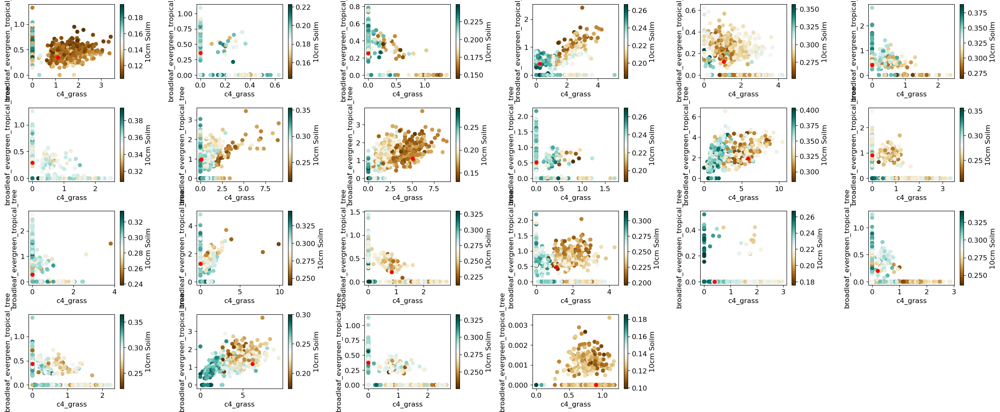

In [37]:
# All grass dominated cells
plt.figure(figsize=[24,10])
plt.rcParams.update({'font.size': 12})

#cvar = TOTSOMN_amean
#cvar = TWS_amean
cvar = H2OSOI_amean.isel(levsoi=2)

ii = 1
for cell in range(22):
    
    cix = c4_ix[0][cell]
    plt.subplot(4,6,ii+cell)
    plt.scatter(cellpft_lai[:,c4_ix[0][cell],14]*frac[c4_ix[0][cell],14],cellpft_lai[:,c4_ix[0][cell],4]*frac[c4_ix[0][cell],4],c=cvar.isel(gridcell=c4_ix[0][cell]),cmap='BrBG')
    plt.colorbar(label='10cm Soilm')
    plt.scatter(cellpft_lai[0,c4_ix[0][cell],14]*frac[c4_ix[0][cell],14],cellpft_lai[0,c4_ix[0][cell],4]*frac[c4_ix[0][cell],4],c='red')
    plt.xlabel(pft_names[14])
    plt.ylabel(pft_names[4])
    #plt.xlim([0,12])
    #plt.ylim([0,0.5])

plt.tight_layout()
plt.savefig('./working_dir/figs/pft_interactions/p14p4_by10cmSoilM.png')

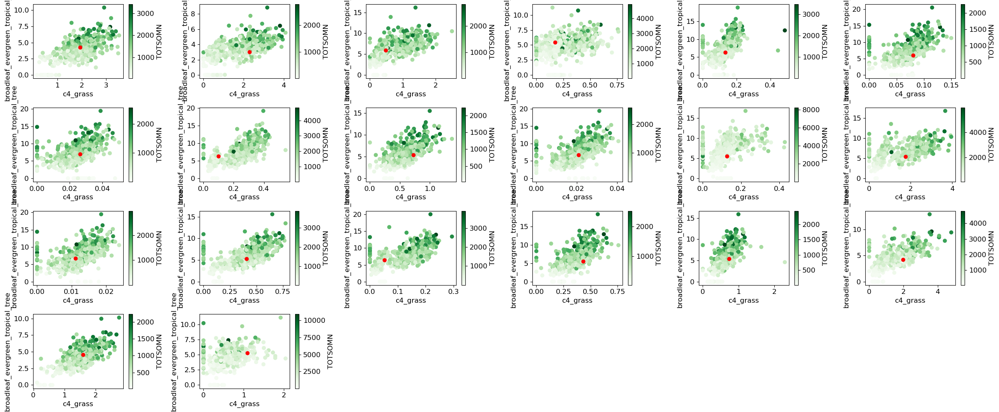

In [44]:
# All co-ominated cells
plt.figure(figsize=[24,10])
plt.rcParams.update({'font.size': 12})

cvar = TOTSOMN_amean
#cvar = TWS_amean

ii = 1
for cell in range(20):
    
    cix = tree_ix[0][cell]
    plt.subplot(4,6,ii+cell)
    plt.scatter(cellpft_lai[:,cix,14]*frac[cix,14],cellpft_lai[:,cix,4]*frac[cix,4],c=cvar.isel(gridcell=cix),cmap='Greens')
    plt.colorbar(label='TOTSOMN')
    plt.scatter(cellpft_lai[0,cix,14]*frac[cix,14],cellpft_lai[0,cix,4]*frac[cix,4],c='red')
    plt.xlabel(pft_names[14])
    plt.ylabel(pft_names[4])
    #plt.xlim([0,12])
    #plt.ylim([0,0.5])

plt.tight_layout()
plt.savefig('./working_dir/figs/pft_interactions/p14p4_byGridcellNitrogen_treedom.png')

In [ ]:
# All tree-dominated cells
plt.figure(figsize=[24,10])
plt.rcParams.update({'font.size': 12})

cvar = TOTSOMN_amean
#cvar = TWS_amean

ii = 1
for cell in range(21):
    
    cix = tree_ix[0][cell]
    plt.subplot(4,6,ii+cell)
    plt.scatter(cellpft_lai[:,cix,14]*frac[cix,14],cellpft_lai[:,cix,4]*frac[cix,4],c=cvar.isel(gridcell=cix),cmap='Greens')
    plt.colorbar(label='TOTSOMN')
    plt.scatter(cellpft_lai[0,cix,14]*frac[cix,14],cellpft_lai[0,cix,4]*frac[cix,4],c='red')
    plt.xlabel(pft_names[14])
    plt.ylabel(pft_names[4])
    #plt.xlim([0,12])
    #plt.ylim([0,0.5])

plt.tight_layout()
plt.savefig('./working_dir/figs/pft_interactions/p14p4_byGridcellNitrogen_codom.png')

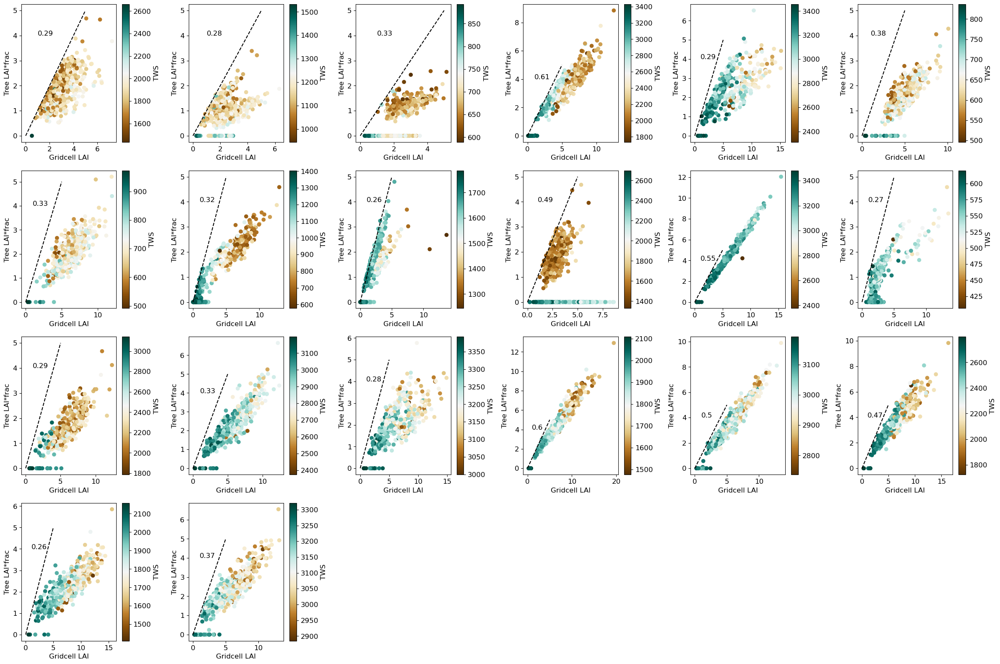

In [53]:
plt.figure(figsize=[24,16])
plt.rcParams.update({'font.size': 12})

cix = co_ix[0]

cTWS = TWS_amean.isel(gridcell=cix)
grass_LAI = cellpft_lai[:,cix,4]*frac[cix,4]
cLAI = TLAI_amax_grid.isel(gridcell=cix)

ii = 0
for cell in range(20):
    plt.subplot(4,6,ii+1)
    plt.scatter(cLAI[:,cell],grass_LAI[:,cell],c=cTWS.isel(gridcell=cell),cmap ='BrBG')
    plt.colorbar(label='TWS')
    plt.text(1,4,s=str(np.round(frac[cix[cell],4],2)))
    plt.plot([0,5],[0,5],'--',c='k')
    plt.xlabel('Gridcell LAI')
    plt.ylabel('Tree LAI*frac')

    ii = ii+1

plt.tight_layout()

### Does sensitivity to parameter change with presence of other PFTs?

In [204]:
frac = np.zeros((400,17))*np.NaN
lhc_cell_lai = np.zeros((501,400,17))*np.NaN
lhc_cell_btran = np.zeros((501,400,17))*np.NaN
lhc_cell_nlim = np.zeros((501,400,17))*np.NaN
#pft_cell_lai = np.zeros((25,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    frac[:,pft] = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
    lhc_cell_lai[:,:,pft] = TLAI_amean.isel(pft=ixpft).compute()
    lhc_cell_btran[:,:,pft] = BTRAN.isel(pft=ixpft).compute()
    lhc_cell_nlim[:,:,pft] = NLIM_amean.isel(pft=ixpft).compute()
    #pft_cell_lai[:,:,pft] = PFT_amax.isel(pft=ixpft).compute()

In [122]:
lhc_cell_gpp = np.zeros((501,400,17))*np.NaN
#pft_cell_gpp = np.zeros((25,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    lhc_cell_gpp[:,:,pft] = LHC_GPP_amean.isel(pft=ixpft).compute()
    #pft_cell_gpp[:,:,pft] = PFT_GPP_amean.isel(pft=ixpft).compute()

In [191]:
#cix = np.where((frac[:,1]>0.5) | (frac[:,7]>0.5))[0] # tree dominant
cix = np.where((frac[:,4]>0.25) & (frac[:,14]>0.25))[0] # co-dominant
#cix = np.where((frac[:,13]>0.5))[0] # grass dominant

#cix = np.where((frac[:,11]>0.35) & (frac[:,12]>0.35))[0] 

In [192]:
cix

array([ 33,  47,  55,  60,  64,  68,  69,  73,  78,  80,  90, 101, 106,
       108, 109, 113, 118, 119, 124, 131, 140])

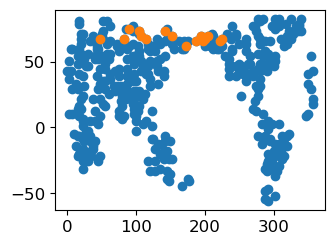

In [141]:
plt.subplot(2,2,1)
#ix = cix[1]
plt.scatter(ds_h1.grid1d_lon,ds_h1.grid1d_lat)
plt.scatter(ds_h1.grid1d_lon.isel(gridcell=cix),ds_h1.grid1d_lat.isel(gridcell=cix),label='C3 dominated cells')

#plt.subplot(2,2,2)
#plt.scatter(range(1,17),frac[ix,1:17])
#plt.xlabel('PFT')
#plt.ylabel('fractional coverage')
#plt.title('Gridcell='+str(ix))

plt.tight_layout()

In [113]:
nanx = np.isnan(lhc_cell_lai[:,:,13])
tmp = lhc_cell_lai[:,:,13].squeeze()
tmp[nanx]=0.0

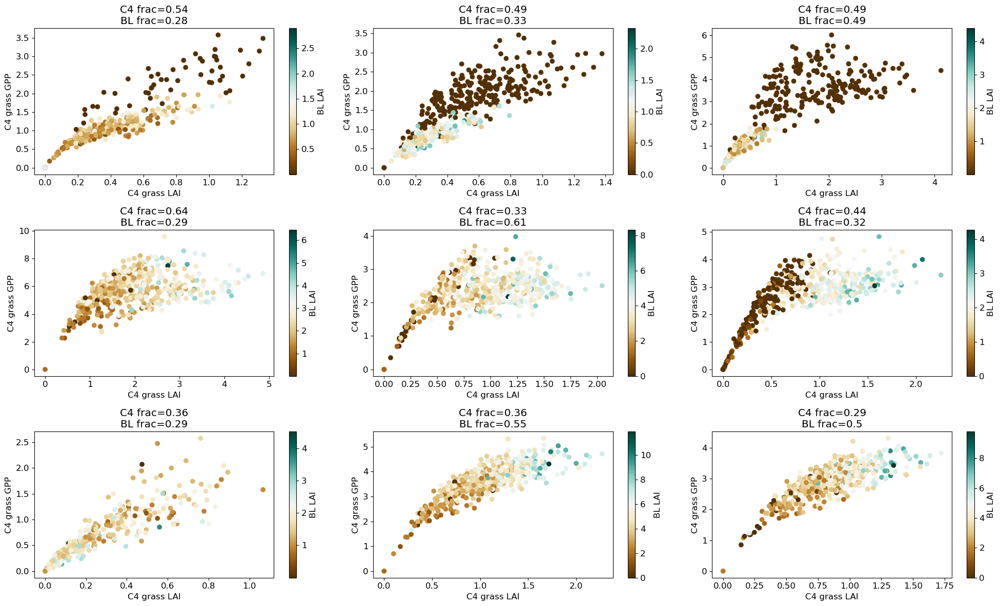

In [125]:
# C4 grass and BL evergreen trees
plt.figure(figsize=[20,12])
plt.rcParams.update({'font.size': 12})

cix = np.where((frac[:,4]>0.25) & (frac[:,14]>0.25))[0] # co-dominant

ii= 1
#for cell in range(len(cix)):
for cell in [1,2,9,4,3,7,0,10,16]:
    ix = cix[cell]

    C4LAI = lhc_cell_lai[:,ix,14]*frac[ix,14]
    BLLAI = lhc_cell_lai[:,ix,4]*frac[ix,4]
    #C3LAI = tmp[:,ix]*frac[ix,13]
    #BLDLAI = lhc_cell_lai[:,ix,6]*frac[ix,6]
    #N = TOTSOMN_amean.isel(gridcell=ix)
    #TWS = TWS_amean.isel(gridcell=ix)
    #TWS = H2OSOI_amean.isel(levsoi=2,gridcell=ix)
    #Btran = lhc_cell_btran[:,ix,4]
    #Nlim = lhc_cell_nlim[:,ix,4]
    C4GPP = lhc_cell_gpp[:,ix,14]*frac[ix,14]*86400
    plt.subplot(3,3,ii)
    plt.scatter(C4LAI,C4GPP,c=BLLAI,cmap ='BrBG')#,vmin=0,vmax=1)
    plt.colorbar(label='BL LAI')
    #plt.text(1.5,0.1,s='C4 frac='+str(np.round(frac[ix,14],2)))
    #plt.text(1.5,1,s='BL frac='+str(np.round(frac[ix,4],2)))
    #plt.plot([0,5],[0,5],'--',c='k')
    plt.xlabel('C4 grass LAI')
    plt.ylabel('C4 grass GPP')
    plt.title('C4 frac='+str(np.round(frac[ix,14],2)) +'\n'+'BL frac='+str(np.round(frac[ix,4],2)))

    #C4LAI = pft_cell_lai[:,ix,14]*frac[ix,14]
    #BLLAI = pft_cell_lai[:,ix,4]*frac[ix,4]
    #C4GPP = pft_cell_gpp[:,ix,14]*frac[ix,14]*86400
    #plt.scatter(C4LAI,C4GPP,c=BLLAI,cmap ='BrBG')
    
    #plt.xlim([0,12])
    #plt.ylim([0,12])
    ii = ii+1


plt.tight_layout()
plt.savefig('./working_dir/figs/pft_interactions/GPPLAI_C4meanLAI-BL.png')

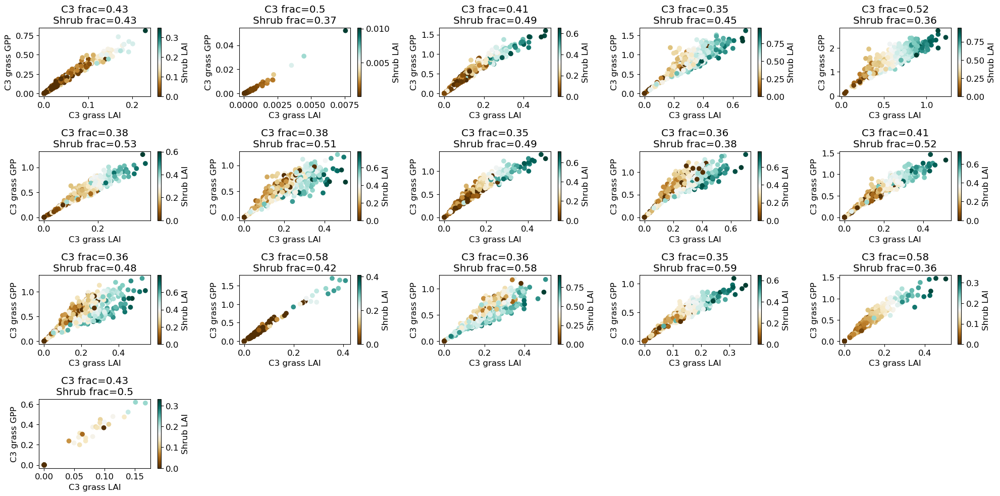

In [146]:
# C3 arctic grass and Deciduous boreal shrubs
plt.figure(figsize=[20,12])
plt.rcParams.update({'font.size': 12})

cix = np.where((frac[:,11]>0.35) & (frac[:,12]>0.35))[0] 

ii= 1
for cell in range(len(cix)):
#for cell in [1,2,9,4,3,7,0,10,16]:
    ix = cix[cell]

    C3LAI = lhc_cell_lai[:,ix,12]*frac[ix,12]
    SHLAI = lhc_cell_lai[:,ix,11]*frac[ix,11]
    #C3LAI = tmp[:,ix]*frac[ix,13]
    #BLDLAI = lhc_cell_lai[:,ix,6]*frac[ix,6]
    #N = TOTSOMN_amean.isel(gridcell=ix)
    #TWS = TWS_amean.isel(gridcell=ix)
    #TWS = H2OSOI_amean.isel(levsoi=2,gridcell=ix)
    #Btran = lhc_cell_btran[:,ix,4]
    #Nlim = lhc_cell_nlim[:,ix,4]
    C3GPP = lhc_cell_gpp[:,ix,12]*frac[ix,12]*86400
    plt.subplot(5,5,ii)
    plt.scatter(C3LAI,C3GPP,c=SHLAI,cmap ='BrBG')#,vmin=0,vmax=1)
    plt.colorbar(label='Shrub LAI')
    #plt.text(1.5,0.1,s='C4 frac='+str(np.round(frac[ix,14],2)))
    #plt.text(1.5,1,s='BL frac='+str(np.round(frac[ix,4],2)))
    #plt.plot([0,5],[0,5],'--',c='k')
    plt.xlabel('C3 grass LAI')
    plt.ylabel('C3 grass GPP')
    plt.title('C3 frac='+str(np.round(frac[ix,12],2)) +'\n'+'Shrub frac='+str(np.round(frac[ix,11],2)))

    #C4LAI = pft_cell_lai[:,ix,14]*frac[ix,14]
    #BLLAI = pft_cell_lai[:,ix,4]*frac[ix,4]
    #C4GPP = pft_cell_gpp[:,ix,14]*frac[ix,14]*86400
    #plt.scatter(C4LAI,C4GPP,c=BLLAI,cmap ='BrBG')
    
    #plt.xlim([0,12])
    #plt.ylim([0,12])
    ii = ii+1


plt.tight_layout()
plt.savefig('./working_dir/figs/pft_interactions/GPPLAI_C3arcticLAIGPP-Shrub.png')

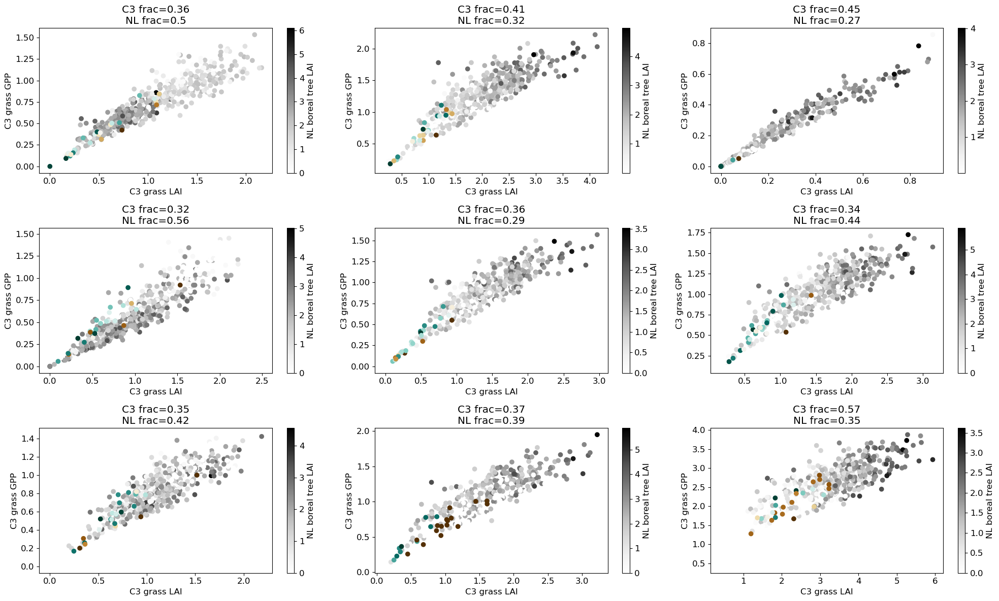

In [103]:
# Water
plt.figure(figsize=[20,12])
plt.rcParams.update({'font.size': 12})

cix = np.where((frac[:,2]>0.25) & (frac[:,12]>0.25))[0] # co-dominant

ii= 1
#for cell in range(len(cix)):
for cell in [0,1,4,6,7,8,11,12,13]:
    ix = cix[cell]

    C3LAI = lhc_cell_lai[:,ix,12]*frac[ix,12]
    NLLAI = lhc_cell_lai[:,ix,2]*frac[ix,2]
    C3GPP = lhc_cell_gpp[:,ix,12]*frac[ix,12]*86400
    plt.subplot(3,3,ii)
    plt.scatter(C3LAI,C3GPP,c=NLLAI,cmap ='Greys')#,vmin=0,vmax=3.5)
    plt.colorbar(label='NL boreal tree LAI')
    #plt.text(1.5,0.1,s='C4 frac='+str(np.round(frac[ix,14],2)))
    #plt.text(1.5,1,s='BL frac='+str(np.round(frac[ix,4],2)))
    #plt.plot([0,5],[0,5],'--',c='k')
    plt.xlabel('C3 grass LAI')
    plt.ylabel('C3 grass GPP')
    plt.title('C3 frac='+str(np.round(frac[ix,12],2)) +'\n'+'NL frac='+str(np.round(frac[ix,2],2)))

    C3LAI = pft_cell_lai[:,ix,12]*frac[ix,12]
    NLLAI = pft_cell_lai[:,ix,2]*frac[ix,2]
    C3GPP = pft_cell_gpp[:,ix,12]*frac[ix,12]*86400
    plt.scatter(C3LAI,C3GPP,c=NLLAI,cmap ='BrBG')
    
    #plt.xlim([0,12])
    #plt.ylim([0,12])
    ii = ii+1


plt.tight_layout()
#plt.savefig('./working_dir/figs/pft_interactions/GPPLAI_C3NL.png')

### Get PFT LAI experiment

In [24]:
u_params     = ['FUN_fracfixers','KCN','a_fix','crit_dayl','d_max','fff','fstor2tran','grperc',
                'jmaxb0','jmaxb1','kcha','lmrha','lmrhd','nstem','q10_mr','soilpsi_off','sucsat_sf',
                'tpu25ratio','tpuse_sf','wc2wjb0']
pft_params   = ['froot_leaf','kmax','krmax','leaf_long','leafcn','lmr_intercept_atkin',
                'medlynslope','medlynintercept','psi50','slatop','stem_leaf','theta_cj']
col_names = ['FUN_fracfixers','KCN','a_fix','crit_dayl','d_max','fff','fstor2tran','grperc',
                'jmaxb0','jmaxb1','kcha','lmrha','lmrhd','nstem','q10_mr','soilpsi_off','sucsat_sf',
                'tpu25ratio','tpuse_sf','wc2wjb0','froot_leaf','kmax','krmax','leaf_long','leafcn','lmr_intercept_atkin',
                'medlynslope','medlynintercept','psi50','slatop','stem_leaf','theta_cj']

In [25]:
# read in parameter sets
top_sets = np.load('./exp2_PFT/pftLAI_psets_8-25.npy',allow_pickle=True).item()
# restructure pft paramsets
top_sets_r = np.empty((25,32,16))*np.NaN

for pft in range(1,15):
    for u in range(25):
        a=[] ; b=[]
        for i,up in enumerate(u_params):
            a.append(top_sets[up][u])
        for i,pp in enumerate(pft_params):
            b.append(top_sets[pp][u][pft])
        top_sets_r[u,:,pft] = np.hstack([a,b])


In [26]:
pft = 4
params = top_sets_r[:,:,pft]
df_params = pd.DataFrame(params,columns=col_names)
pftLAI_params = df_params[lhc_params.columns] # sort pft_params as lhc_params

In [22]:
# load
ds_new_h1=get_exp('pftLAI',dvs=['TLAI','GPP'],tape='h1',yy=(2003,2004))

t=slice(str(2003),str(2004))
da_new = ds_new_h1.TLAI.sel(time=t)

In [16]:
PFT_amax=amax(da_new).mean(dim='year').compute()

In [23]:
da = ds_new_h1.GPP.sel(time=t)
PFT_GPP_amean = amean(da).mean(dim='year').compute()

### Time series

In [217]:
frac = np.zeros((400,17))*np.NaN
lhc_cell_lai = np.zeros((501,400,17))*np.NaN
lhc_cell_btran = np.zeros((501,400,17))*np.NaN
lhc_cell_nlim = np.zeros((501,400,17))*np.NaN
#pft_cell_lai = np.zeros((25,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    frac[:,pft] = ds_h1.pfts1d_wtgcell.isel(pft=ixpft).values
    lhc_cell_lai[:,:,pft] = TLAI_amax.isel(pft=ixpft).compute()
    lhc_cell_btran[:,:,pft] = BTRAN.isel(pft=ixpft).compute()
    lhc_cell_nlim[:,:,pft] = NLIM_amean.isel(pft=ixpft).compute()
    #pft_cell_lai[:,:,pft] = PFT_amax.isel(pft=ixpft).compute()

In [221]:
lhc_cell_gpp = np.zeros((501,400,17))*np.NaN
#pft_cell_gpp = np.zeros((25,400,17))*np.NaN
for pft in range(1,17):
    ixpft = ds_h1.pfts1d_itype_veg==pft
    lhc_cell_gpp[:,:,pft] = LHC_GPP_amean.isel(pft=ixpft).compute()
    #pft_cell_gpp[:,:,pft] = PFT_GPP_amean.isel(pft=ixpft).compute()

In [218]:
# get timeseries of C4 grass 
ixpft = ds_h1.pfts1d_itype_veg==14
C4grass = ds_h1.TLAI.isel(pft=ixpft)

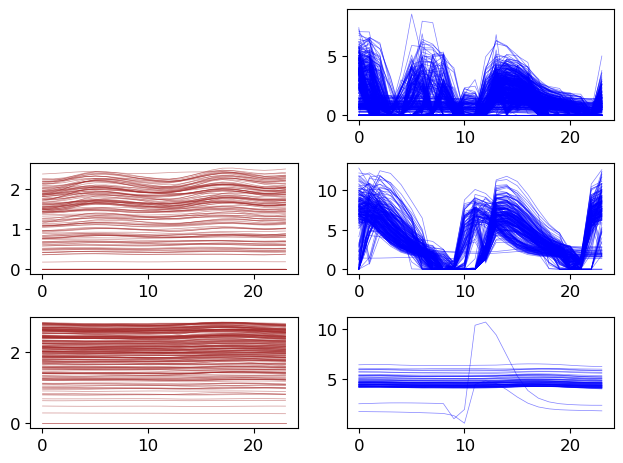

In [225]:
cix = np.where((frac[:,4]>0.25) & (frac[:,14]>0.25))[0] # co-dominant

gridcell=cix[2]
for ens in range(500):
    bl_ens = lhc_cell_gpp[ens,gridcell,14]*frac[ix,14]*86400
    if (bl_ens>2):
        plt.subplot(3,2,1)
        plt.plot(C4grass.isel(pft=gridcell,ens=ens),c='brown',alpha = 0.5,linewidth=0.5)
    if (bl_ens<1):
        plt.subplot(3,2,2)
        plt.plot(C4grass.isel(pft=gridcell,ens=ens),c='blue',alpha = 0.5,linewidth=0.5)
            
gridcell=cix[3]
for ens in range(500):
    bl_ens = lhc_cell_lai[ens,gridcell,14]*frac[gridcell,14]
    if (bl_ens<0.8):
        plt.subplot(3,2,3)
        plt.plot(C4grass.isel(pft=gridcell,ens=ens),c='brown',alpha = 0.5,linewidth=0.5)
    if (bl_ens>2):
        plt.subplot(3,2,4)
        plt.plot(C4grass.isel(pft=gridcell,ens=ens),c='blue',alpha = 0.5,linewidth=0.5)
            

gridcell = cix[10]
for ens in range(500):
    bl_ens = lhc_cell_lai[ens,gridcell,14]*frac[gridcell,14]
    if (bl_ens<1):
        plt.subplot(3,2,5)
        plt.plot(C4grass.isel(pft=gridcell,ens=ens),c='brown',alpha = 0.5,linewidth=0.5)
    if (bl_ens>1.5):
        plt.subplot(3,2,6)
        plt.plot(C4grass.isel(pft=gridcell,ens=ens),c='blue',alpha = 0.5,linewidth=0.5)

plt.tight_layout()
plt.savefig('C4Grass_timeseries.png',dpi=200)

(array([  0.,   0.,   0.,   0.,   0., 501.,   0.,   0.,   0.,   0.]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5]),
 <BarContainer object of 10 artists>)

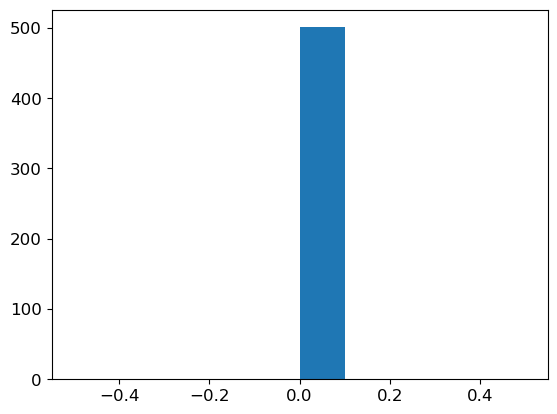

In [229]:
bl_ens = lhc_cell_gpp[:,gridcell,14]*frac[ix,14]*86400
plt.hist(bl_ens)

In [232]:
gridcell=cix[2]
gridcell

55